<a href="https://colab.research.google.com/github/danon6868/BI-ml-2023/blob/main/lecture_9_10_cnn/homework/hw_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Задание 1. Свёртка

**5 баллов**

Реализуйте функцию свёртки `conv(x, kernel, stride, pad)`, где:


* $\text{x}$: Двумерный массив размером $(W,H)$;
* $\text{kernel}$: ядро свёртки размером $(K, K)$;
* $\text{stride}$: шаг ядра свёртки. $0 < \text{stride} \leq \min(W,H)$;
* $\text{pad}$: ширина дополнения с каждой из сторон массива. $\text{pad} > 0$.

Результатм работы функции является возвращение следующего значения:
* $out$: Результат свертки входных данных $\text{x}$, имеющий размер $(H', W')$: 
  - $H' = 1 + (H + 2 \cdot pad - K)\ //\  stride$;
  - $W' = 1 + (W + 2 \cdot pad - K)\  //\ stride$.

---

Воспользуйтесь созданной функцией `conv` для применения [оператора Собеля](https://ru.wikipedia.org/wiki/%D0%9E%D0%BF%D0%B5%D1%80%D0%B0%D1%82%D0%BE%D1%80_%D0%A1%D0%BE%D0%B1%D0%B5%D0%BB%D1%8F) 
к изображению, после чего выведите результат на экран.

Можно работать и с `numpy`, и с `torch`, как вам угодно.

Предложен довольно странный выходной размер из свёртки. Тут, кажется, где-то опечатка (перепутаны местами W' и H'). Картинка 1000 * 1 должна теоретически преобразовываться в картинку 1000 * 1...

In [1]:
import torch
import numpy as np
import math

In [2]:
# Можете тренироваться на этом примере
a = np.arange(9).reshape((3, 3))
M = np.block([[a, a],[a, a]])
print(M)

[[0 1 2 0 1 2]
 [3 4 5 3 4 5]
 [6 7 8 6 7 8]
 [0 1 2 0 1 2]
 [3 4 5 3 4 5]
 [6 7 8 6 7 8]]


In [3]:
def conv(x, kernel, stride, pad):
    x=torch.Tensor(x)
    new_size = tuple([int(1+math.floor((x.shape[0]+2*pad-kernel.shape[0]) / stride)), int(1+math.floor((x.shape[1]+2*pad-kernel.shape[1]) / stride))])
    new_x = torch.zeros(new_size)
    pad = tuple([pad, pad, pad, pad])
    x = torch.nn.functional.pad(x, pad, mode='constant', value=0)
    for new_i, i in enumerate(range(0, x.shape[0]-kernel.shape[0]+1, stride)):
        for new_j, j in enumerate(range(0, x.shape[1]-kernel.shape[1]+1, stride)):
            new_x[new_i,new_j] = sum(sum(x[i:i+kernel.shape[0],j:j+kernel.shape[1]]*kernel))
    return(new_x)

In [4]:
sobel_zero = torch.Tensor([
                                  [0, 0, 0],
                                  [0, 0, 0],
                                  [0, 0, 0]
])

sobel_ones = torch.Tensor([
                                  [1, 1, 1],
                                  [1, 1, 1],
                                  [1, 1, 1]
])

sobel_one = torch.Tensor([
                                  [0, 0, 0],
                                  [0, 1, 0],
                                  [0, 0, 0]
])

sobel_kernel_vert = torch.Tensor([
                                  [-1, 0, 1],
                                  [-2, 0, 2],
                                  [-1, 0, 1]
])


sobel_kernel_hor = torch.Tensor([
                                 [-1, -2, -1],
                                 [0, 0, 0],
                                 [1, 2, 1]
])

В попытке понять, что мой код работает правильно, было нарисовано ещё 3 тривиальных преобразования) Предлагается проверить корректность именно на sobel_one, потому что доподлинно известно, что должно получиться в таком случае) 

In [5]:
M_new = conv(M, sobel_one, stride = 1, pad = 1)
print(M)
print(M_new)

[[0 1 2 0 1 2]
 [3 4 5 3 4 5]
 [6 7 8 6 7 8]
 [0 1 2 0 1 2]
 [3 4 5 3 4 5]
 [6 7 8 6 7 8]]
tensor([[0., 1., 2., 0., 1., 2.],
        [3., 4., 5., 3., 4., 5.],
        [6., 7., 8., 6., 7., 8.],
        [0., 1., 2., 0., 1., 2.],
        [3., 4., 5., 3., 4., 5.],
        [6., 7., 8., 6., 7., 8.]])


Результат соответствует нашим ожиданиям с любыми адекватными pad и stride. Продолжим....

Примените эти два фильтра к следующей картинке и нарисуйте полученные результаты:

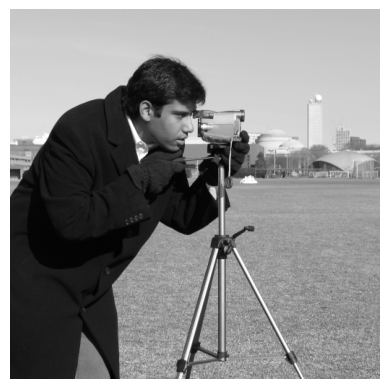

In [6]:
from skimage import data
import matplotlib.pyplot as plt

camera = data.camera()
plt.figure()
plt.imshow(camera.astype("int"), cmap="gray", vmin=0, vmax=255)
plt.axis("off");

Как-то надо запихнуть картинку в торч, поколдуем немного...

In [7]:
import torchvision.transforms.functional as F
import torchvision.transforms as T
from PIL import Image

raw_photo = F.to_tensor(camera)[0]

transform = T.ToPILImage()

Накатим предложенные преобразование на картинки и попробуем подумать над результатом:

In [8]:
camera_s_hor_filter = conv(raw_photo, sobel_kernel_hor, 1, 1)
camera_s_vert_filter = conv(raw_photo, sobel_kernel_vert, 1, 1)
camera_with_borders = np.sqrt(camera_s_hor_filter**2 + camera_s_vert_filter**2)

img_hor = transform(camera_s_hor_filter)
img_vert = transform(camera_s_vert_filter)
img_full = transform(camera_with_borders)

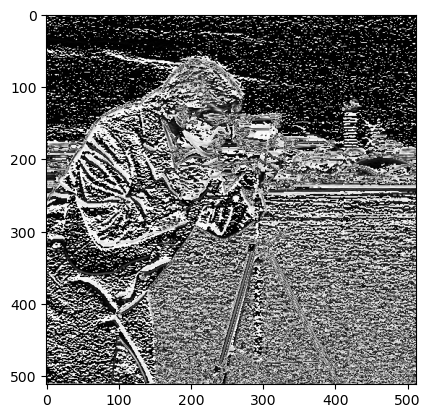

In [9]:
plt.imshow(img_hor, cmap="gray", vmin=0, vmax=255)

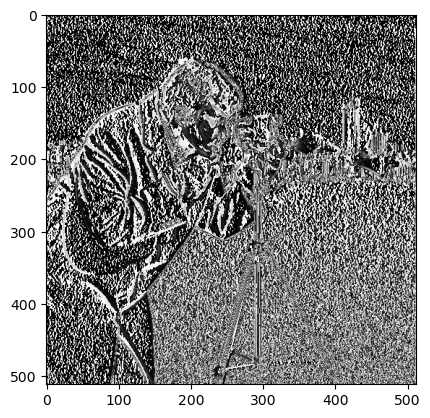

In [10]:
plt.imshow(img_vert, cmap="gray", vmin=0, vmax=255)

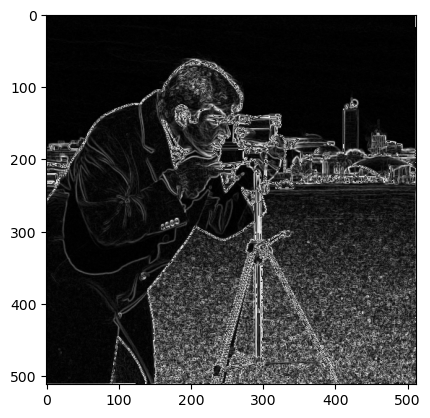

In [11]:
plt.imshow(img_full, cmap="gray", vmin=0, vmax=255)

Эксперимент стиля "а почему надо вешать корень из суммы квадратов..."

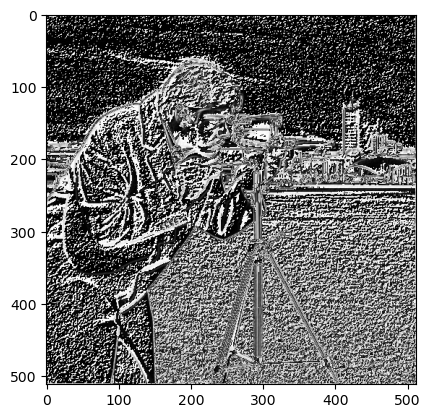

In [12]:
camera_with_borders_1 = (camera_s_hor_filter + camera_s_vert_filter)/2
img_full_1 = transform(camera_with_borders_1)
plt.imshow(img_full_1, cmap="gray", vmin=0, vmax=255)

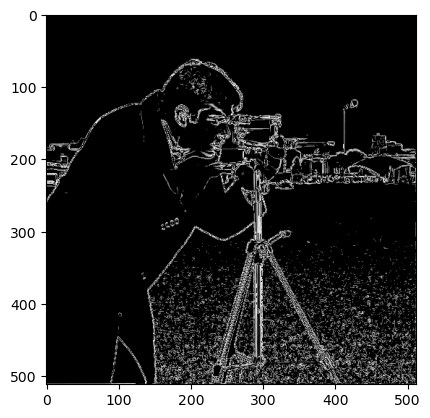

In [13]:
camera_with_borders_2 = np.power((camera_s_hor_filter**100 + camera_s_vert_filter**100), 0.01)
img_full_2 = transform(camera_with_borders_2)
plt.imshow(img_full_2, cmap="gray", vmin=0, vmax=255)

Что же, операторы Собеля позволяют вытаскивать градиент яркости в точке. При этом, горизонтальный вытаскивает "разность" по горизонтали, вертикальный - соответственно по вертикали. Корень из суммы квадратов - норма градинета в точке, там где она большая, находится граница яркости изображения. Это довольно хорошо видно на границе чёрной курстки фотографа с сероватым окружением. 

Первые две картинки - доказательство утверждения про градиентты в горизонтальном и вертикальном направлениях.

В эксперименте с попыткой получения чего-то другого при "прямом усреднении" и взятии "откровенно большой степени", видно, что можно выделять всё более резкие границы, игнорируя слабые (задушить малые градиенты). 

## Задание 2. AlexNet

**15 баллов**

Воссоздайте архитектуру `AlexNet` для определения заболевания растения. Датасеты уже созданы ниже.

In [29]:
INPUT_IMAGE_SIZE = 227
BATCH_SIZE = 64
N_EPOCHS = 25 # можно будет при желании увеличить
print(torch.cuda.is_available())
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

True


In [15]:
from IPython.display import clear_output

from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor, Compose, ToPILImage
from torchvision.transforms import Normalize, Resize

from glob import glob
from torch import nn
from torch.nn import functional as F
import torch
import os
 
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

In [16]:
!wget https://storage.googleapis.com/ibeans/train.zip
!wget https://storage.googleapis.com/ibeans/validation.zip
!wget https://storage.googleapis.com/ibeans/test.zip

clear_output()

In [17]:
!unzip train.zip
!unzip validation.zip
!unzip test.zip

clear_output()

In [18]:
class BeanDataset(Dataset):
    def __init__(self, img_dir, side_size=INPUT_IMAGE_SIZE):
        # папка с картинками
        self.img_dir = img_dir
        # отсортированный список с названиями файлов
        self.files = sorted(glob(f'{img_dir}/*/*.jpg'))
        class_names = sorted(os.listdir(img_dir))
        # названия папок с картинками переведем в номера классов
        self.class_dir = {name:idx for idx, name in enumerate(class_names)}
        self._number_to_labels = {idx:name for idx, name in enumerate(class_names)}

        # трансформации данных: мы изменяем размер,
        # так как AlexNet работает с картинками 227 на 227 пикселей
        self.transforms = Compose([ToPILImage(),
                                  Resize(side_size),
                                  ToTensor(),
                                  Normalize(
                                      mean = [0.5183, 0.4845, 0.6570],
                                      std = [0.2111, 0.2227, 0.2291]
                                  )])
        self._transforms_for_plot = Compose([ToPILImage(),
                                  Resize(side_size),
                                  ToTensor()
                                  ])


    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx, normalize=True):
        file_path = self.files[idx]
        image = read_image(file_path).type(torch.DoubleTensor)

        # применяем трансформации
        if normalize:
            transformed_img = self.transforms(image)
        
        transformed_img = self._transforms_for_plot(image)
        
        label_name = file_path.split('/')[-2]
        label = self.class_dir[label_name]
        
        # как обычно возвращаем картинку и номер класса
        return transformed_img, label

In [19]:
train_dataset = BeanDataset("./train/")
valid_dataset = BeanDataset("./validation/")
test_dataset = BeanDataset("./test/")

trainloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
validloader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False)
testloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Посмотрим на наши картинки:

(код довольно эзотерический, но у меня было такое настроение)

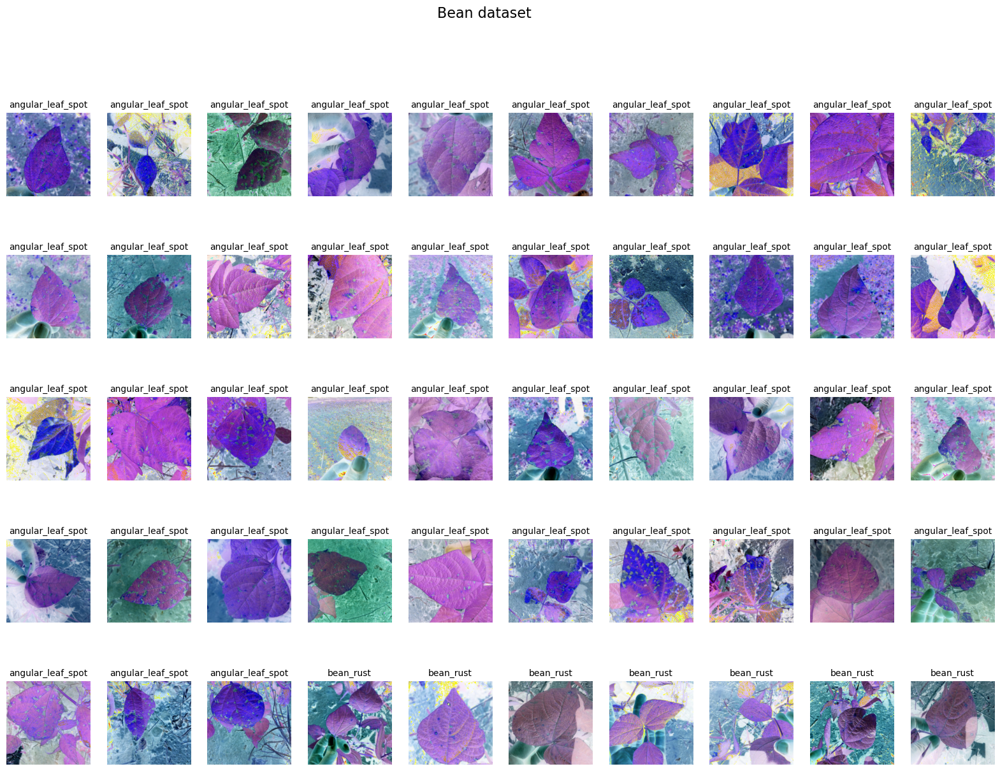

In [20]:
ROW_IMG = 10
N_ROWS = 5

fig = plt.figure(figsize=(20, 14))
for index in range(1, ROW_IMG * N_ROWS + 1):
    plt.subplot(N_ROWS, ROW_IMG, index)
    plt.axis('off')
    plt.imshow(valid_dataset.__getitem__(index, normalize=False)[0].permute(1, 2, 0))
    title = valid_dataset._number_to_labels[valid_dataset.__getitem__(index, normalize=False)[1]]
    plt.title(title, fontsize=10)
    
fig.suptitle("Bean dataset", fontsize=16);

### Реализация `AlexNet`

В лекции мы познакомились с архитектурой `AlexNet`, теперь пришло время реализовать ее самостоятельно. Важно, что на выходе число классов у нас будет сильно меньше чем 1000, нужно будет в начале это определить. Везде в качестве активации используется `ReLU`.

Также обратите внимание на параметры пулинга, тут ядро 3х3 со страйдом 2 (поэтому он называется overlapping).

Картинка может немного отличаться от того, что было на лекции, ориентируйтесь на картинку в ноутбуке.

Внимательно смотрите на параметры сверток (например, padding / stride).

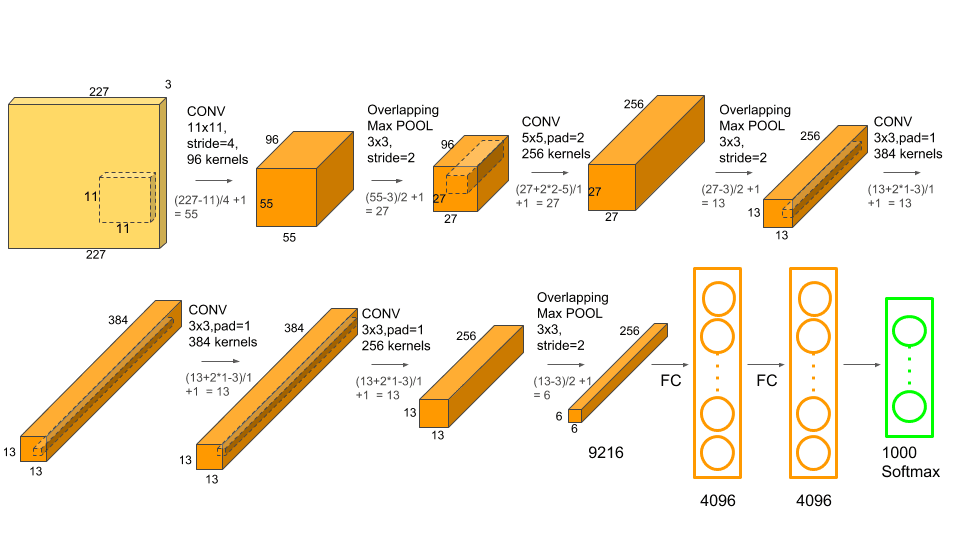

In [30]:
N_CLASSES = 3
LEARNING_RATE = 3e-4 # можно подобрать как-то другой)

In [31]:
class AlexNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.feature_extractor = nn.Sequential(            
            nn.Conv2d(in_channels = 3, out_channels = 96, kernel_size = 11, stride = 4, padding = 0),
            nn.ReLU(inplace=True),
            
            nn.MaxPool2d(kernel_size=3, stride=2),
            
            nn.Conv2d(in_channels = 96, out_channels = 256, kernel_size=5, stride = 1, padding=2),
            nn.ReLU(inplace=True),
            
            nn.MaxPool2d(kernel_size=3, stride=2),
            
            nn.Conv2d(in_channels = 256, out_channels = 384, kernel_size=3, stride = 1, padding=1),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(in_channels = 384, out_channels = 384, kernel_size=3, stride = 1, padding=1),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(in_channels = 384, out_channels = 256, kernel_size=3, stride = 1, padding=1),
            nn.ReLU(inplace=True),
            
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        
        self.classifier = nn.Sequential(
            nn.Linear(in_features=256*6*6, out_features=4096),
            nn.ReLU(inplace=True),
            nn.Linear(in_features=4096, out_features=4096),
            nn.ReLU(inplace=True),
            nn.Linear(in_features=4096, out_features=3),
        )

    def forward(self,x):
        x = self.feature_extractor(x)
        x = torch.flatten(x, 1)
        logits = self.classifier(x)
        probs = F.softmax(logits, dim=1)
        
        return logits, probs

Возьмите код для обучения и валидации модели, который был на лекции (если захочется, то его можно как угодно менять). В лекции мы возвращали из модели помимо логитов еще и вероятности классов, чтобы потом рисовать красивые картинки. Если захотите сделать также, то учтите это.

In [32]:
def train_epoch(train_loader, model, criterion, optimizer, device):
    """
    Function for the training step of the training loop
    """

    model.train()
    running_loss = 0
    
    for X, y_true in train_loader:

        optimizer.zero_grad()
        
        X = X.to(device)
        y_true = y_true.to(device)

        y_hat, _ = model(X) 
        loss = criterion(y_hat, y_true) 
        running_loss += loss.item() * X.size(0)

        loss.backward()
        optimizer.step()
        
    epoch_loss = running_loss / len(train_loader.dataset)
    return model, optimizer, epoch_loss


def validate_epoch(valid_loader, model, criterion, device):
    """
    Function for the validation step of the training loop
    """
   
    model.eval()
    running_loss = 0
    
    for X, y_true in valid_loader:
    
        X = X.to(device)
        y_true = y_true.to(device)

        y_hat, _ = model(X) 
        loss = criterion(y_hat, y_true) 
        running_loss += loss.item() * X.size(0)

    epoch_loss = running_loss / len(valid_loader.dataset)
        
    return model, epoch_loss


def get_accuracy(model, dataloader, device):
    """
    model - 
    dataloader - 
    """
    correct = 0
    total = 0
    with torch.no_grad(): # Тензоры внутри этого блока будут иметь requires_grad=False
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = correct / total
    
    return accuracy


def plot_losses(train_losses, valid_losses):
    sns.lineplot(x=np.arange(1, len(train_losses)+1), y=train_losses, label="Train Loss")
    sns.lineplot(x=np.arange(1, len(train_losses)+1), y=valid_losses, label="Validation Loss")


def training_loop(model, criterion, optimizer, train_loader, valid_loader, epochs, device, print_every=1):
    """
    Function defining the entire training loop
    """

    best_loss = 1e10
    train_losses = []
    valid_losses = []
 
    # Train model
    for epoch in range(0, epochs):

        # training
        model, optimizer, train_loss = train_epoch(train_loader, model, criterion, optimizer, device)
        train_losses.append(train_loss)

        # validation
        with torch.no_grad():
            model, valid_loss = validate_epoch(valid_loader, model, criterion, device)
            valid_losses.append(valid_loss)

        if epoch % print_every == (print_every - 1):
            
            train_acc = get_accuracy(model, train_loader, device=device)
            valid_acc = get_accuracy(model, valid_loader, device=device)
                
            print(f'{datetime.now().time().replace(microsecond=0)} --- '
                  f'Epoch: {epoch}\t'
                  f'Train loss: {train_loss:.4f}\t'
                  f'Valid loss: {valid_loss:.4f}\t'
                  f'Train accuracy: {100 * train_acc:.2f}\t'
                  f'Valid accuracy: {100 * valid_acc:.2f}')
        if valid_acc > 0.8:
            break

    plot_losses(train_losses, valid_losses)
    
    return model, train_losses, valid_losses

Выберите функцию потерь и оптимизатор и обучите полученную модель на тренировочных данных, параллельно проверяя ее на валидационной части:

In [33]:
model = AlexNet().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = nn.CrossEntropyLoss()

22:43:23 --- Epoch: 0	Train loss: 1.1035	Valid loss: 1.0969	Train accuracy: 33.37	Valid accuracy: 33.08
22:43:35 --- Epoch: 1	Train loss: 1.0869	Valid loss: 1.0645	Train accuracy: 52.90	Valid accuracy: 47.37
22:43:45 --- Epoch: 2	Train loss: 1.0018	Valid loss: 0.9506	Train accuracy: 62.57	Valid accuracy: 57.89
22:43:56 --- Epoch: 3	Train loss: 0.8698	Valid loss: 0.8886	Train accuracy: 65.96	Valid accuracy: 63.91
22:44:07 --- Epoch: 4	Train loss: 0.7560	Valid loss: 0.9394	Train accuracy: 60.74	Valid accuracy: 58.65
22:44:17 --- Epoch: 5	Train loss: 0.7281	Valid loss: 0.7898	Train accuracy: 65.67	Valid accuracy: 67.67
22:44:27 --- Epoch: 6	Train loss: 0.7251	Valid loss: 0.7523	Train accuracy: 66.34	Valid accuracy: 61.65
22:44:37 --- Epoch: 7	Train loss: 0.7184	Valid loss: 0.6979	Train accuracy: 74.66	Valid accuracy: 74.44
22:44:48 --- Epoch: 8	Train loss: 0.6281	Valid loss: 0.6718	Train accuracy: 75.82	Valid accuracy: 72.93
22:44:57 --- Epoch: 9	Train loss: 0.6271	Valid loss: 0.7217	Trai

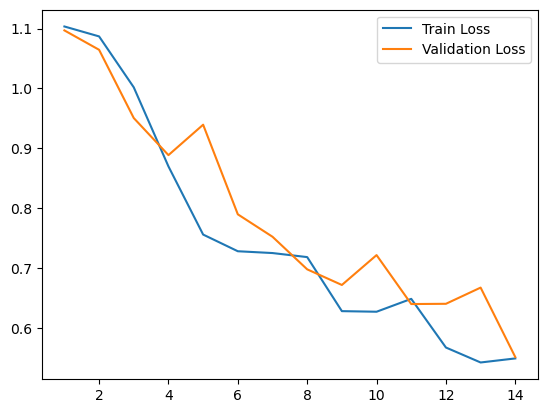

In [34]:
model, train_losses, val_losses = training_loop(model, criterion, optimizer, trainloader, validloader, N_EPOCHS, DEVICE)

Если вы все реализовали правильно, то `accuracy` на валидации должна быть в районе 0.8.

Что же, мы видим, что модель пробила точность на валидации 0.8 за 14 эпох и была остановлена. Остановка введена для того чтобы получить какую-то более-менее лучшую модель на выходе.

### Визуализация предсказаний

Визуализируем предсказания нашей модели и степень уверенности в них. Сделайте выводы о качестве полученной модели.

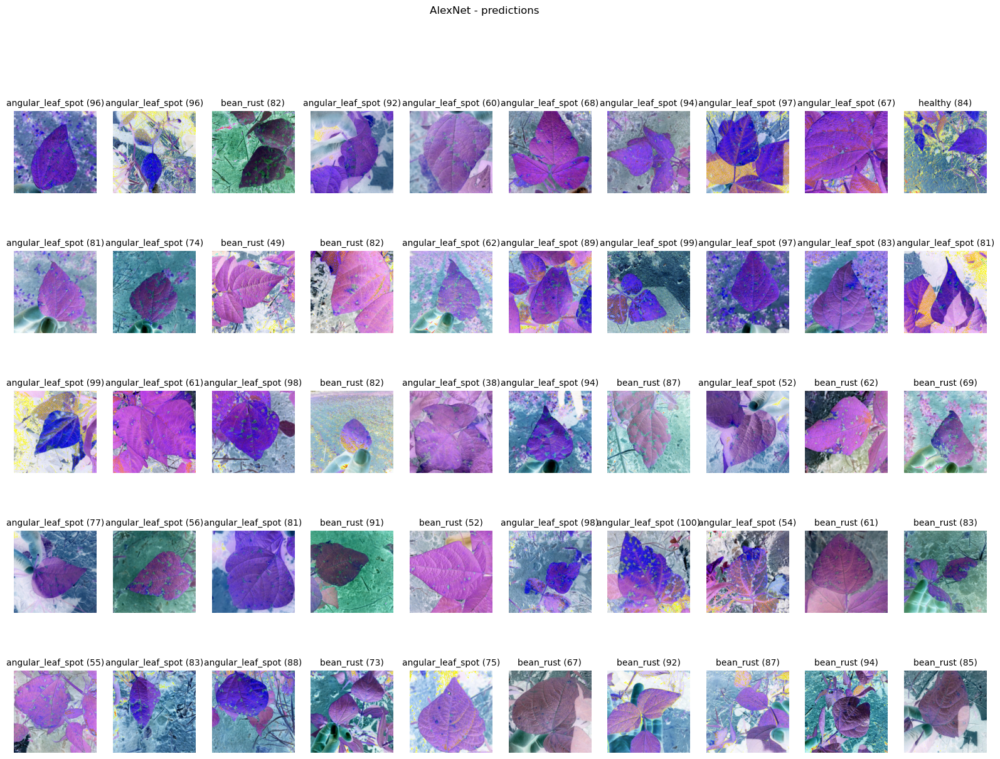

In [38]:
ROW_IMG = 10
N_ROWS = 5

fig = plt.figure(figsize=(20, 14))
for index in range(1, ROW_IMG * N_ROWS + 1):
    plt.subplot(N_ROWS, ROW_IMG, index)
    plt.axis('off')
    plt.imshow(valid_dataset.__getitem__(index, normalize=False)[0].permute(1, 2, 0))
    
    with torch.no_grad():
        # error)
        model.cpu().eval()
        _, probs = model(valid_dataset[index][0].unsqueeze(0))
        
    title = f"{valid_dataset._number_to_labels[torch.argmax(probs).item()]} ({torch.max(probs * 100):.0f})"
    
    plt.title(title, fontsize=10)
fig.suptitle('AlexNet - predictions');

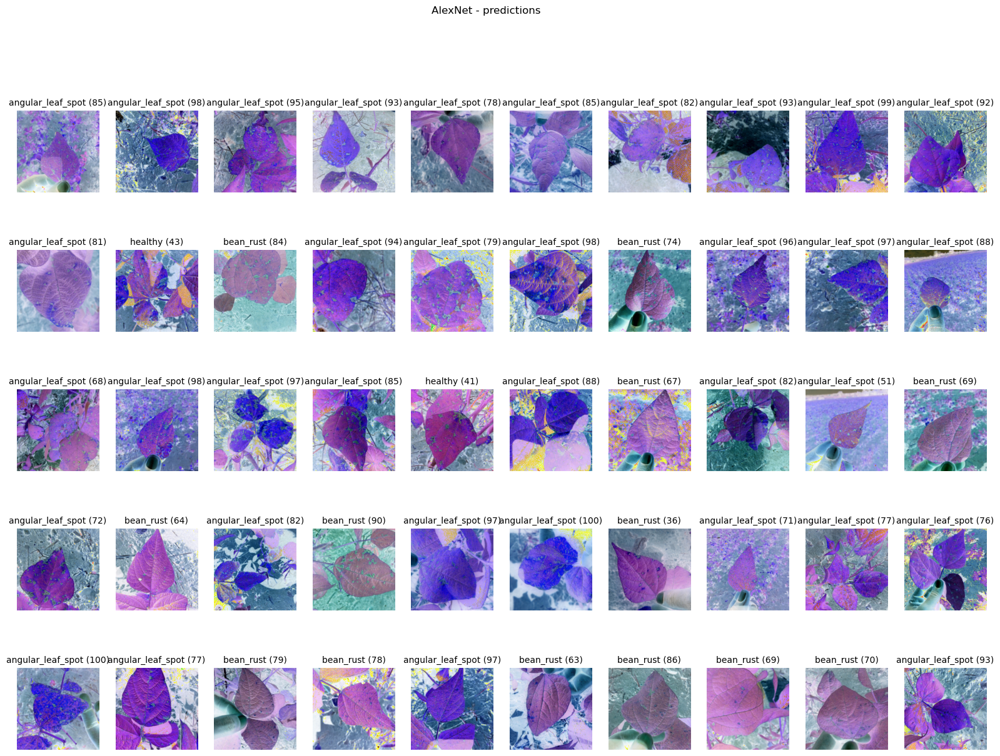

In [39]:
ROW_IMG = 10
N_ROWS = 5

fig = plt.figure(figsize=(20, 14))
for index in range(1, ROW_IMG * N_ROWS + 1):
    plt.subplot(N_ROWS, ROW_IMG, index)
    plt.axis('off')
    plt.imshow(test_dataset.__getitem__(index, normalize=False)[0].permute(1, 2, 0))
    
    with torch.no_grad():
        # error)
        model.cpu().eval()
        _, probs = model(test_dataset[index][0].unsqueeze(0))
        
    title = f'{torch.argmax(probs)} ({torch.max(probs * 100):.0f}%)'
    title = f"{test_dataset._number_to_labels[torch.argmax(probs).item()]} ({torch.max(probs * 100):.0f})"
    
    plt.title(title, fontsize=10)
fig.suptitle('AlexNet - predictions');

Ну, в принципе по числам кажется, что всё неплохо работает. 80% точности на валидации дают возможность говорить об успехе. Честно говоря, на взгляд здесь очень тяжело различать angular leaf spot и bean rust... Но видимо модель делает это достаточно уверенно (степень уверенности от 60 до 100% как на тесте, так и на валидации). В действительности, модель скорее всего можно ещё поучить и получить результат чуть лучше, но важно не переобучиться при этом.

## Задание 3. И снова социализация

**1 дополнительный балл**

Однажды такое уже бывало, но почему бы не повторить. Сходите погулять вместе с одногруппниками или созвонитесь в зуме, а сюда прикрепите какие-нибудь фотографии и кратко опишите, на какие темы вы общались)

Тут, как обычно, можно описать свои эмоции от выполнения этого задания:

**Ответ:**